In [1]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("../../../src/")

import os
import pandas as pd
import numpy as np
import random
from eda.utils_plot import get_upack_patch, save2pdf, visualize_col_data
from eda.general_eda import general_stats, general_eda_main

## Stats computation & analysis of AI4boundaries dataset

For each country:

1. Download image mask.
2. compute patch stats.
3. compute general stats.
4. download images+masks for problematic patches (e. g. no fields, small number of fields, small percentage of fields, complex fields, ...).
5. visualize random problematic patches.
6. final analysis for country.

Comparison analysis between countries. Localization. Number of parcels, area covered with fields, parcels sizes, parcels geometry, ...
Final analysis.

In [2]:
SENTINEL2_DIR = "ai4boundaries_dataset" # your path here

## Catalonia (ES)

In [4]:
country = "ES"

#### General EDA for the country

General information: 
          n_fields  prc_fields  sm_area_cnt  bg_area_cnt  sm_solidity_cnt  \
count  652.000000  652.000000   652.000000   652.000000       652.000000   
mean   228.044479   44.623620    75.360429     0.397239         0.305215   
std    158.955189   28.567694    75.098055     1.131938         0.803470   
min      0.000000    0.000000     0.000000     0.000000         0.000000   
25%     98.000000   18.900000    21.000000     0.000000         0.000000   
50%    226.500000   48.650000    58.000000     0.000000         0.000000   
75%    336.500000   69.000000   102.500000     0.000000         0.000000   
max    790.000000   95.400000   521.000000     9.000000         9.000000   

       bg_solidity_cnt  sm_eccentricity_cnt    area_min    area_mean  \
count       652.000000           652.000000  605.000000   605.000000   
mean        118.039877             8.161043    3.062810   152.006139   
std          88.627103            12.481266   17.208385   131.897727   
min 

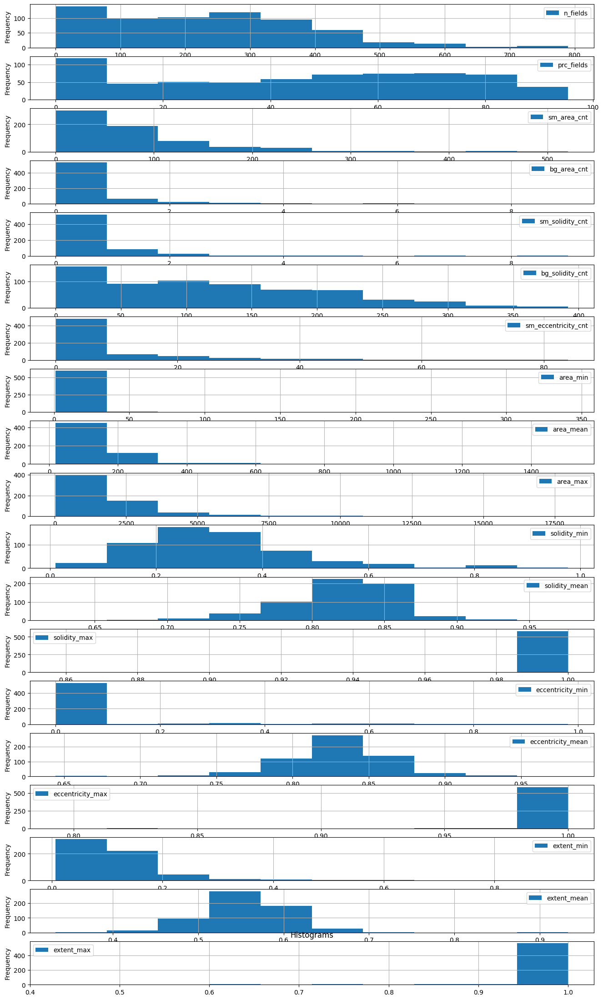

Total number of fields 0.15 M
Total area of fields in ha 19.07 M
Number of patches without fields present 47 (7.21%)
Number of patches with small percentage  (< 10) of fields present 73 (11.2%)
Number of patches with small number (< 40) of fields present 54 (8.28%)
Number of patches with small number or small percentage of fields present combined 74 (11.35%)
Number of patches with small number & small percentage of fields present combined 53 (8.13%)
Number of patches with n_fields (>= 545.95) of fields present 20 (3.07%)
Number of patches with prc_fields (>= 75.0) of fields present 117 (17.94%)
Number of patches with prc_fields (< 25.0) of fields present 196 (30.06%)
Number of patches with sm_area_cnt (>= 225.56) of fields present 31 (4.75%)
Number of patches with bg_area_cnt (>= 2.66) of fields present 31 (4.75%)
Number of patches with sm_solidity_cnt (>= 1.91) of fields present 41 (6.29%)
Number of patches with bg_solidity_cnt (>= 295.29) of fields present 21 (3.22%)
Number of patche

In [6]:
data = general_eda_main(SENTINEL2_DIR, country,
                     sm_prc_fields=10, sm_num_fields=40)

### Visualizations of the country data

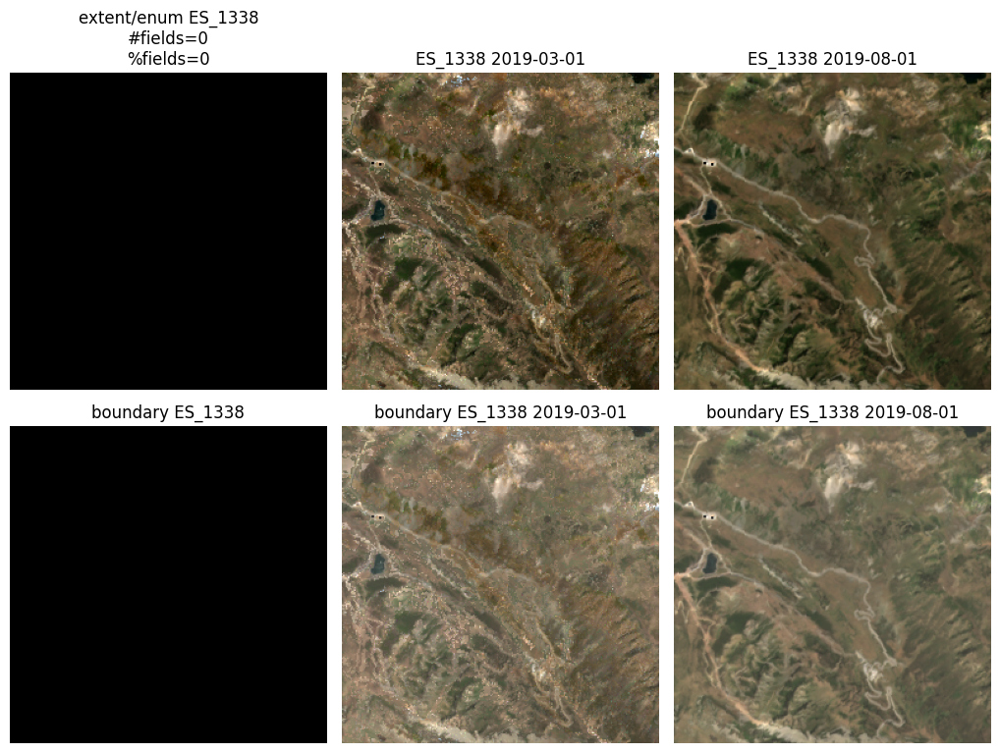

In [17]:
# visualize the data without fields 
visualize_col_data(data, SENTINEL2_DIR, country=country, col='no_field', num_img=2,
                       num_plots=1) # montains

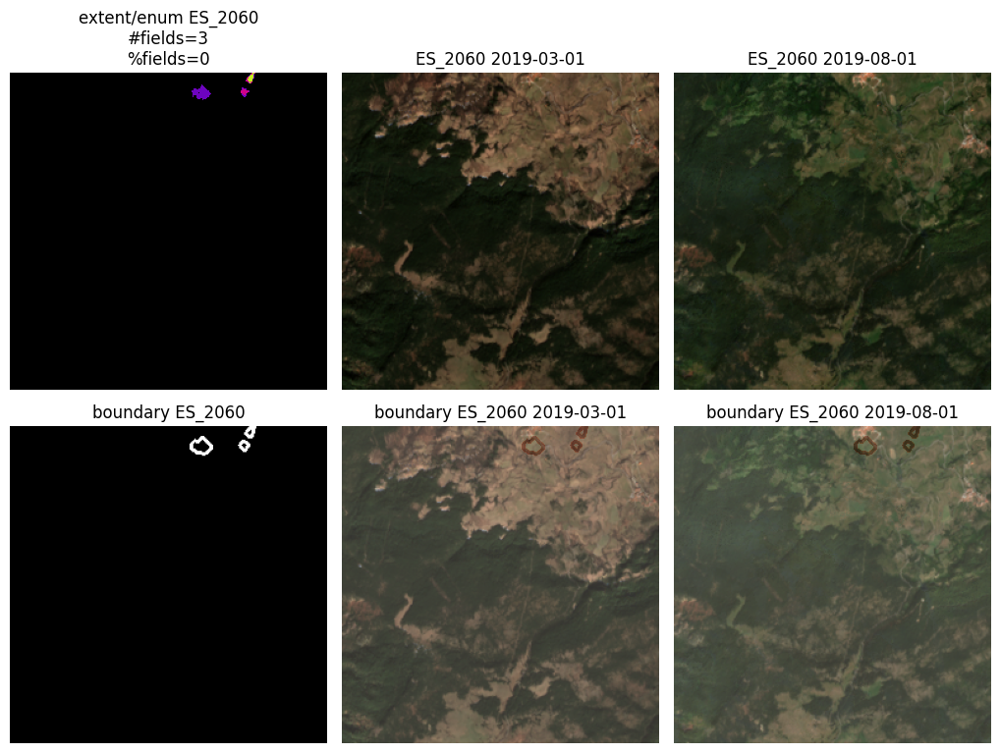

In [20]:
# visualize the data with small number of fields (<40)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_num_fields', num_img=2,
                       num_plots=1) # montains

In [ ]:
# visualize the data with small % of fields (<10%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_prc_fields', num_img=2,
                       num_plots=1) # no interset -> same as 'sm_num_fields'

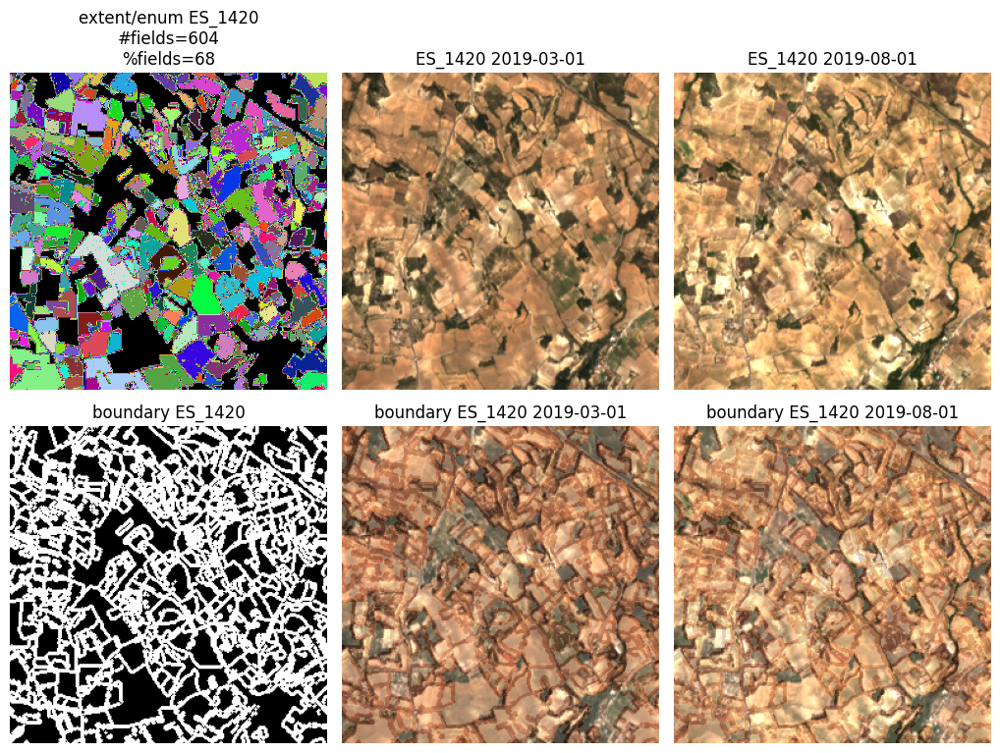

In [28]:
# visualze patches with a lot of fields present
# Number of patches with n_fields (>= 545.95) of fields present 20 (3.07%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='n_fields_gt', num_img=2,
                       num_plots=1) # small parcels

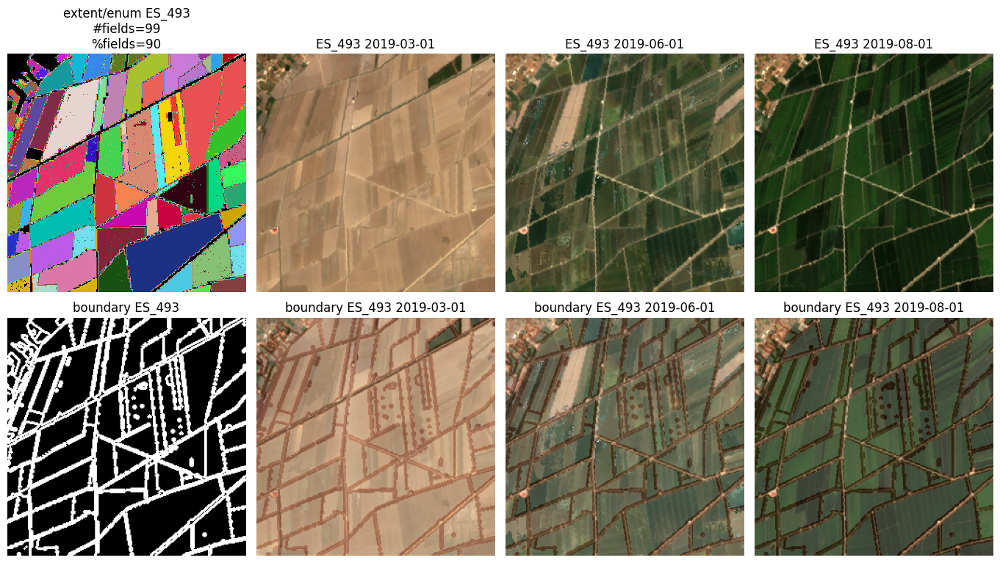

In [29]:
# visualze patches with a lot of % fields present
# Number of patches with prc_fields (>= 75.0) of fields present 117 (17.94%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='prc_fields_gt', num_img=3,
                       num_plots=1) # no interest -> same vis as for 'n_fields_gt'

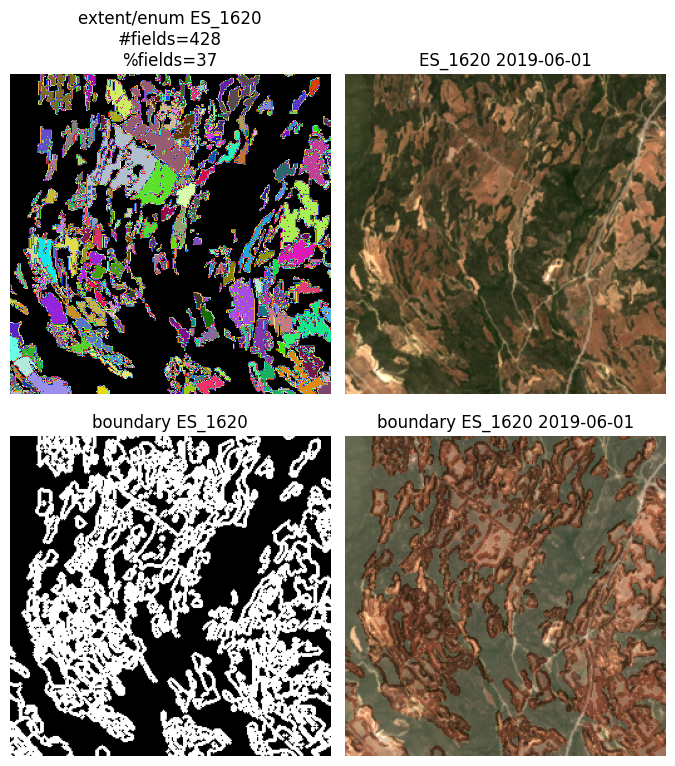

In [30]:
# visualze the patches with #field small area > 103
# Number of patches with sm_area_cnt (>= 225.56) of fields present 31 (4.75%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_area_cnt_gt', num_img=1,
                       num_plots=1) # no intresent -> same vis as for 'n_fields_gt'

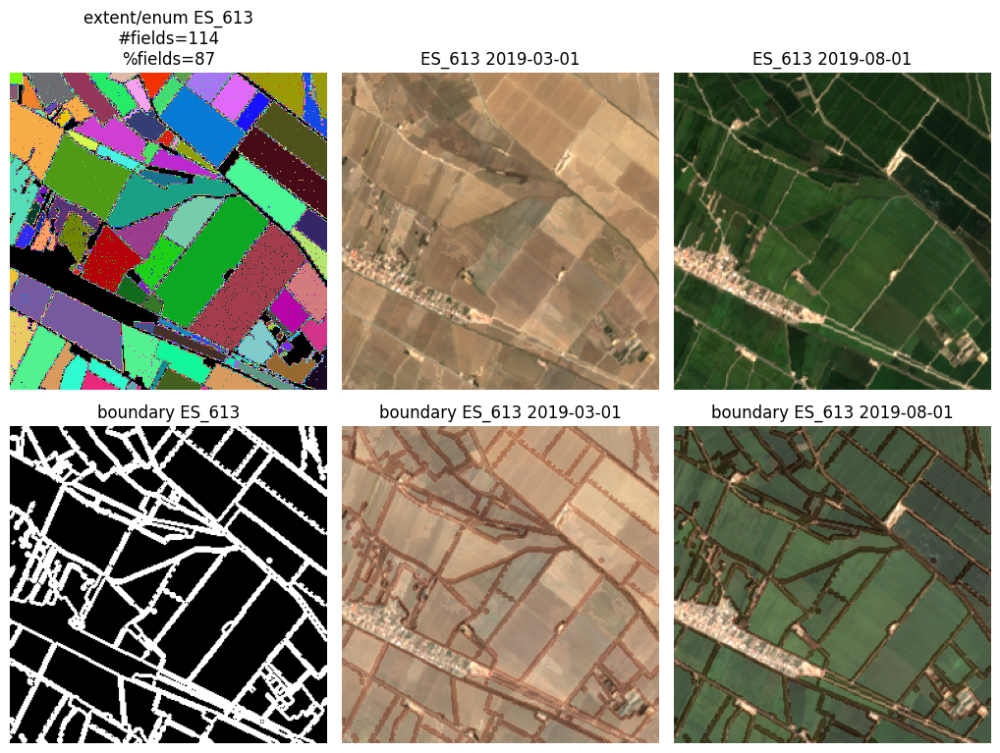

In [32]:
# visualze the patches with the following rool
# Number of patches with bg_area_cnt (>= 2.66) of fields present 31 (4.75%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_area_cnt_gt', num_img=2,
                       num_plots=1) # oversegmentation

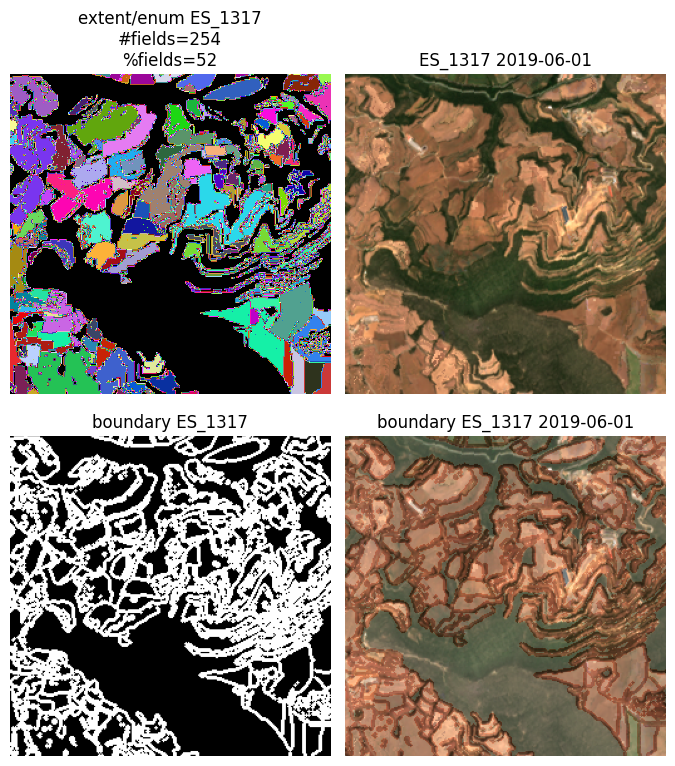

In [33]:
# visualze the patches with the following rool
# Number of patches with sm_solidity_cnt (>= 1.91) of fields present 41 (6.29%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_solidity_cnt_gt', num_img=1,
                       num_plots=1) # irregular parcels shapes

In [ ]:
# visualze the patches with the following rool
# Number of patches with bg_solidity_cnt (>= 295.29) of fields present 21 (3.22%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='bg_solidity_cnt_gt', num_img=2,
                       num_plots=1) # no much intersent (small rectangular/almost square compact fields)

In [ ]:
# visualze the patches with the following rool
# Number of patches with sm_eccentricity_cnt (>= 33.12) of fields present 33 (5.06%)
visualize_col_data(data, SENTINEL2_DIR, country=country, col='sm_eccentricity_cnt_gt', num_img=6,
                       num_plots=1) # no intreset (small parcels)

### Conclusion for the country (ES)

Not much greeanry for every season:

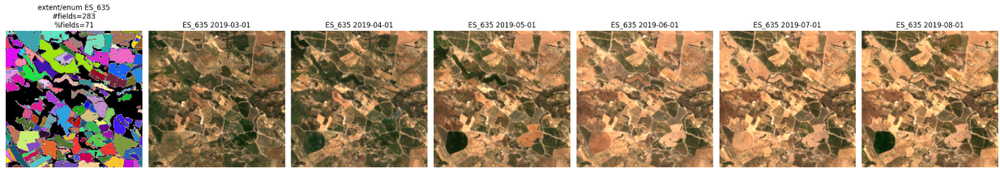

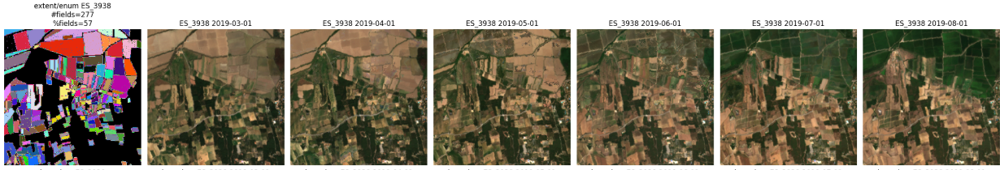

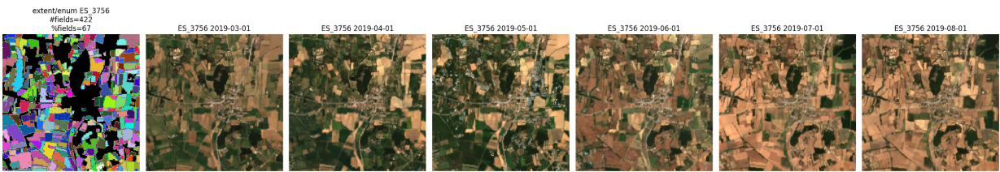

Isolated fields (cause of location in montains):

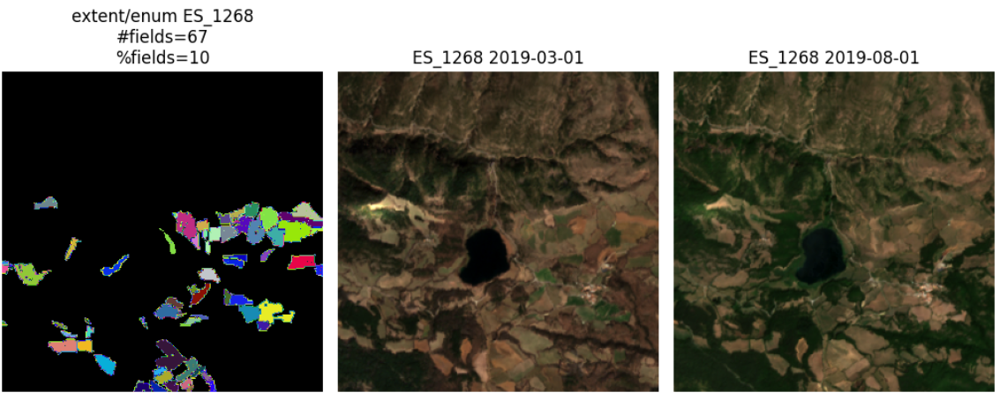


Fields with varies geometries (not only regular rect / square):

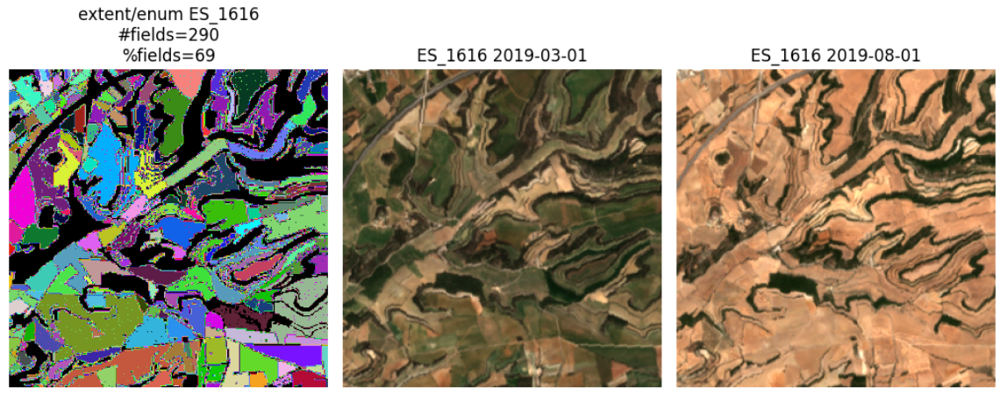

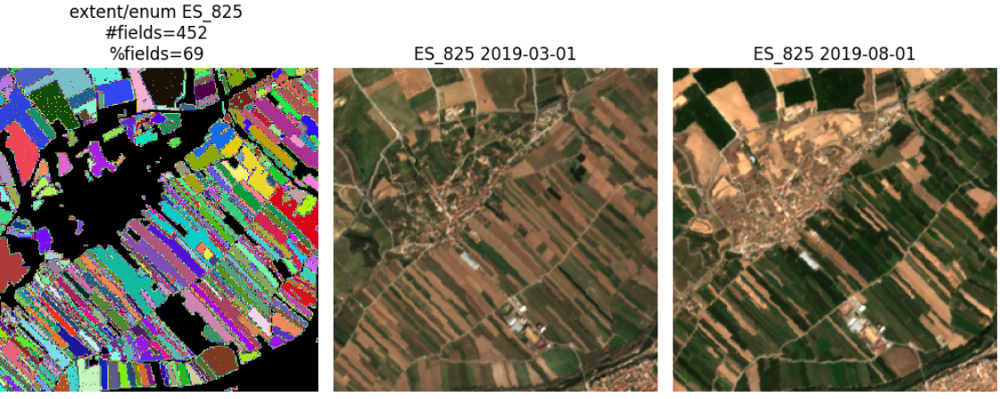

Oversegmentation:

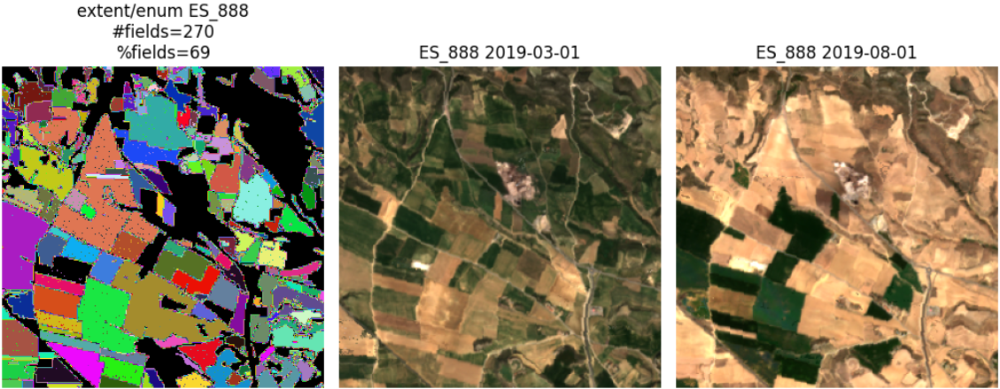


Based on eccentricity visualizations -> no circular fields. 

__TO BE DELETED__: (Number of patches without fields present 47 (7.21%)) +
(Number of patches with small number or small percentage of fields present combined 74 (11.35%)) -> ~18% delete for the training data (clouds artifacts, forest or other greenary/ montains, not clear if there shoud be a field a not).
